# Analysis of the vegetation in diffrent EU cities

### Introduction:

This analysis utilizes data from the Copernicus Sentinel-2 mission to study various European cities. The focus is on vegetation analysis, image segmentation, and calculating vegetation indices. Additionally, data from the Sentinel-1 mission is used for elevation calculations.

### Data Source:

The data for this analysis is sourced from the Copernicus program, which provides high-resolution satellite imagery. Sentinel-2, in particular, offers detailed optical imagery that is ideal for monitoring land use, vegetation, and urban environments.

In [1]:
import os
from PIL import Image
import cv2
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import rasterio
import warnings

## Loading the images

In [3]:
def load_images_from_folder(folder):
    """
    Load all images from the specified folder.
    """
    images = []
    for filename in os.listdir(folder):
        if filename.endswith(".png"):
            img_path = os.path.join(folder, filename)
            img = Image.open(img_path)
            images.append((np.array(img), filename))
    return images

def preprocess_image(image):
    """
    Preprocess the image (convert to RGB and reshape).
    """
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = image.reshape((image.shape[0] * image.shape[1], 3))
    return image

def count_colors(image, n_clusters=10):
    """
    Count and group the pixel colors using KMeans clustering.
    """
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(image)
    return kmeans

directory_path = r'/Users/audrey/Desktop/Geomonitoring/Images_from_ZIP/False_colo'

if not os.path.exists(directory_path):
    print(f"Directory not found: {directory_path}")
else:
    images = load_images_from_folder(directory_path)
    print(f"Loaded {len(images)} images.")

# Preprocessing images and counting colors
preprocessed_images = []
kmeans_models = []

for image, filename in images:
    preprocessed_image = preprocess_image(image)
    kmeans = count_colors(preprocessed_image, n_clusters=10)
    preprocessed_images.append((preprocessed_image, filename))
    kmeans_models.append(kmeans)

print("Preprocessing and clustering completed.")

Loaded 6 images.
Preprocessing and clustering completed.


# Ploting the Color

### Near-Infrared Band (NIR):
- **Assigned to**: Red Channel
- **Explanation**: High reflection in the near-infrared range is characteristic of healthy, dense vegetation. These areas are likely forest areas, parks, or agricultural lands with good plant growth.
- **Significance**: These areas are ecologically valuable as they represent high biomass and plant activity.

### Red Band:
- **Assigned to**: Green Channel
- **Explanation**: This could indicate sparse vegetation, bare soil, or agricultural lands with lower plant growth.
- **Significance**: These areas are potentially prone to erosion and may require measures to improve soil quality and plant cover. They could indicate agricultural lands that are not fully planted or areas in need of regeneration.

### Green Band:
- **Assigned to**: Blue Channel
- **Explanation**: These areas may represent transitional regions, such as urban fringes, that contain both natural and anthropogenic elements.
- **Significance**: These clusters identify urban structures and water bodies, which are crucial for urban planning and water management.

### Overlaps:
- **Explanation**: These areas may represent transitional regions, such as urban fringes, that contain both natural and anthropogenic elements.
- **Significance**: These areas are interesting for the analysis of land use changes and for planning urban developments.

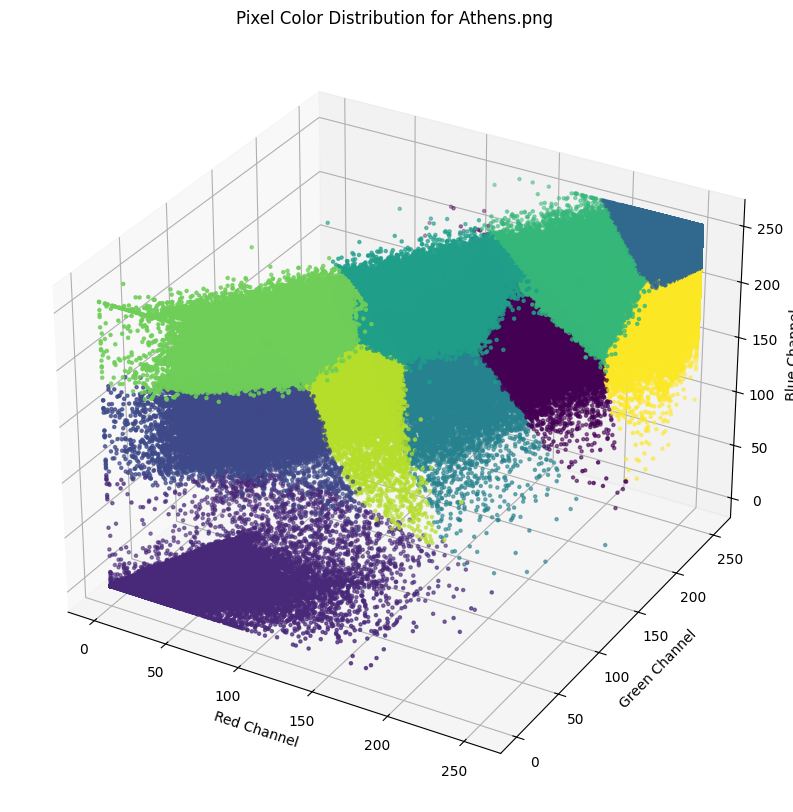

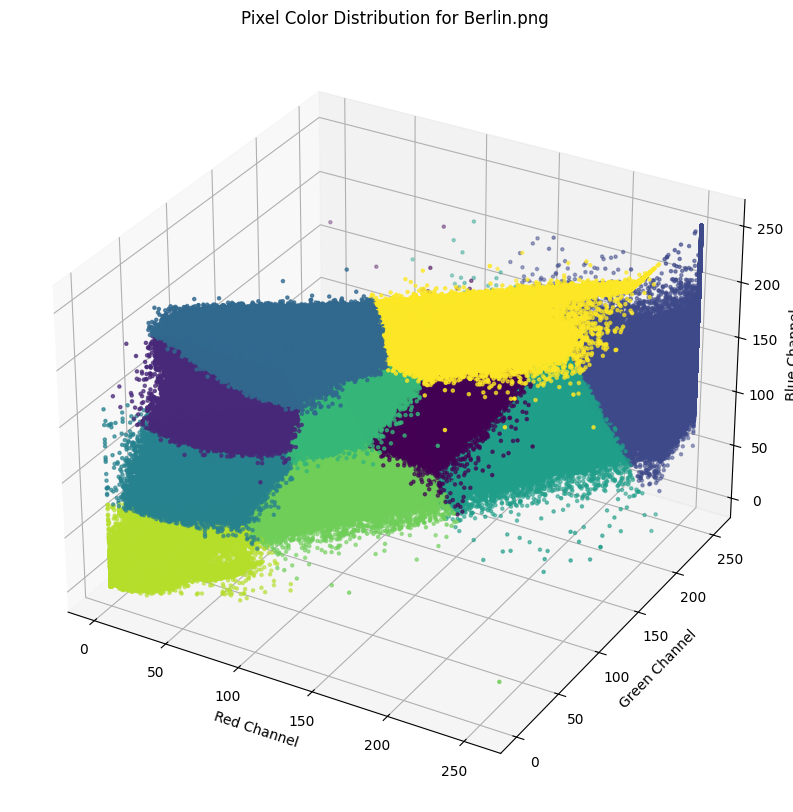

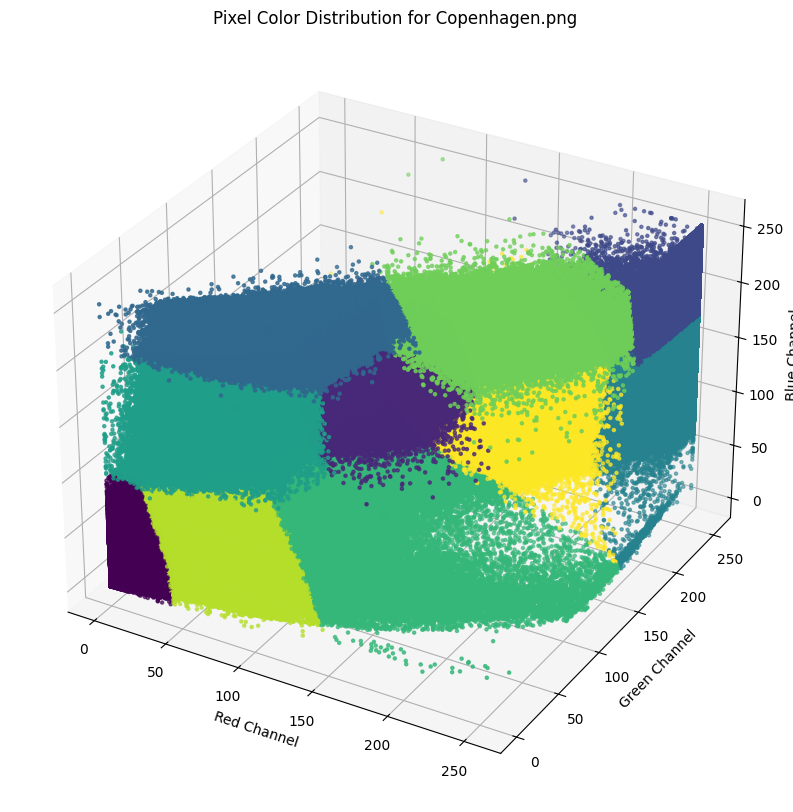

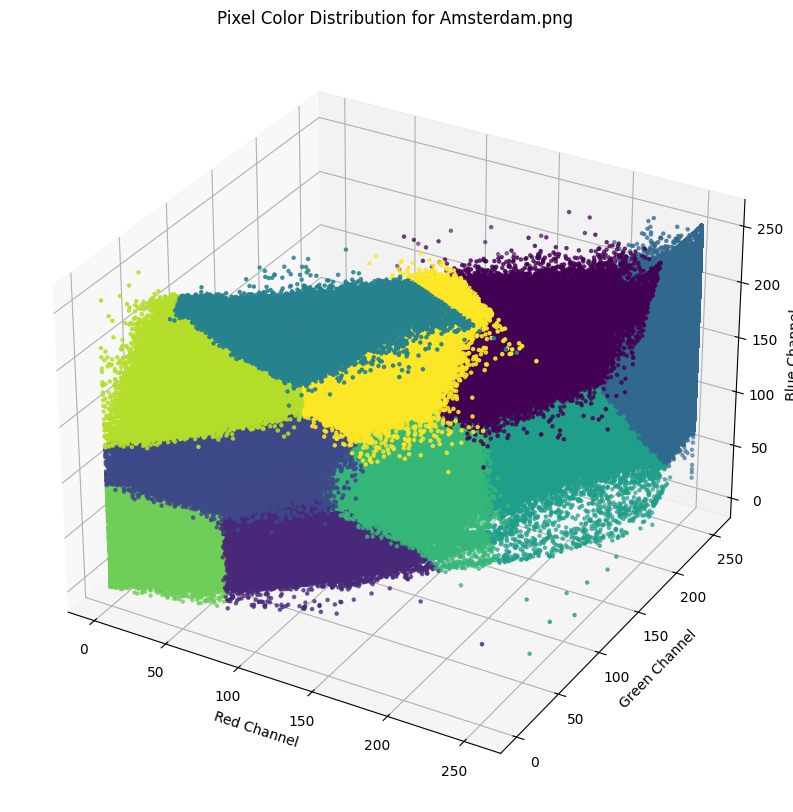

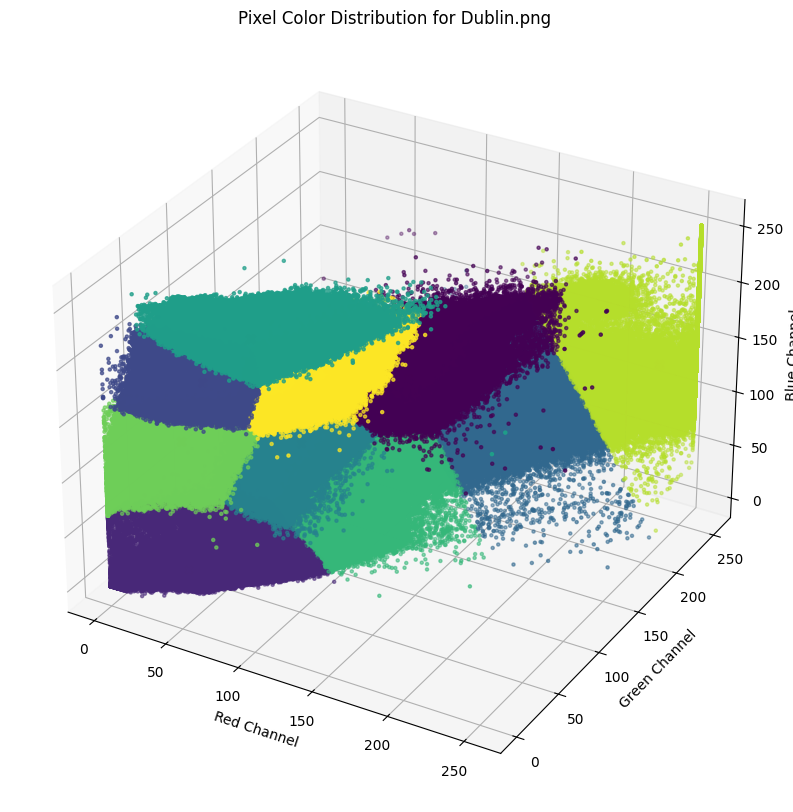

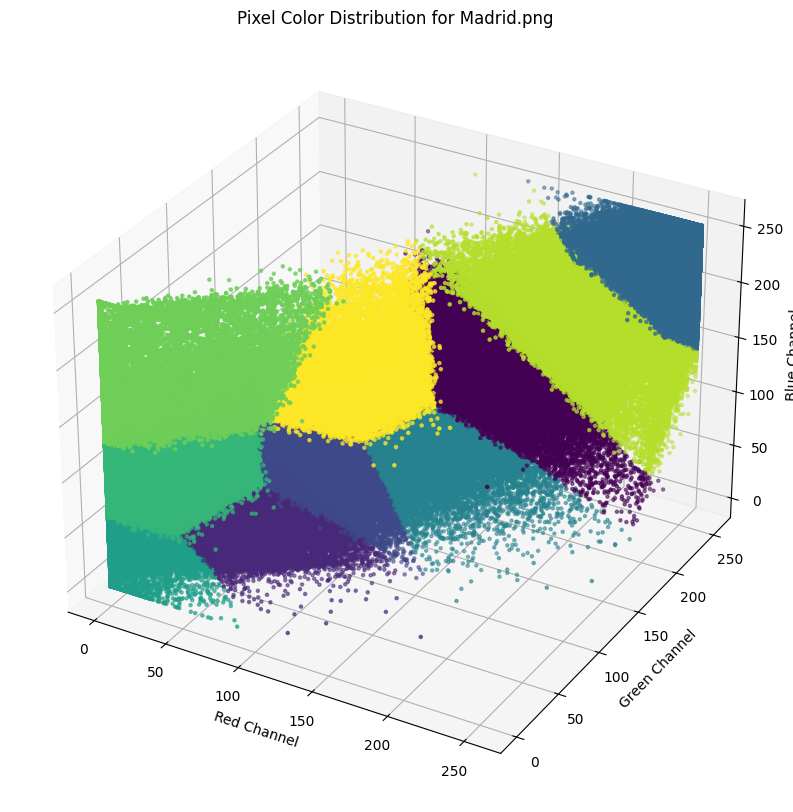

In [4]:
def plot_colors(kmeans, image, image_name):
    """
    Plot the colors in a 3D scatter plot.
    """
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(image[:, 0], image[:, 1], image[:, 2], c=labels, cmap='viridis', marker='.')
    ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], c='red', s=50, marker='X')
    ax.set_title(f'Pixel Color Distribution for {image_name}')
    ax.set_xlabel('Red Channel')
    ax.set_ylabel('Green Channel')
    ax.set_zlabel('Blue Channel')
    plt.show()

# Plot the colors for each image
for (preprocessed_image, filename), kmeans in zip(preprocessed_images, kmeans_models):
    plot_colors(kmeans, preprocessed_image, filename)

# NDVI
Calculates the Normalized Difference Vegetation Index (NDVI) for multiple cities using Near-Infrared (NIR) (B8) and Red (B4) images. NDVI is a measure of vegetation health

Loaded NDVI image pairs for 6 cities.


/var/folders/4h/j6ng9wxx1tzgh72470kkjsnw0000gn/T/ipykernel_39639/2310456672.py:16: RuntimeWarning: invalid value encountered in divide
  ndvi = np.where((nir + red) == 0, 0, (nir - red) / (nir + red))


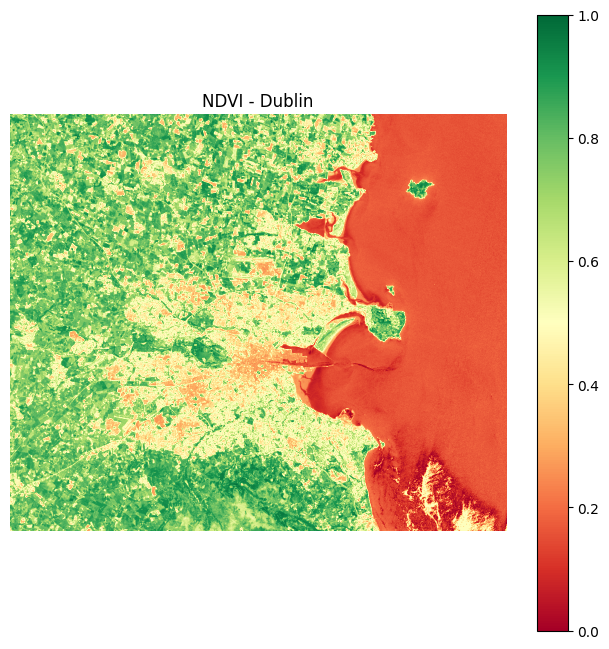

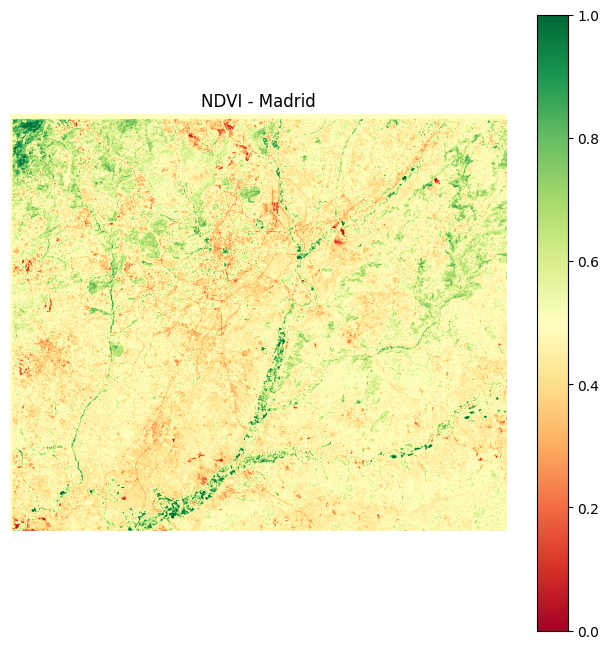

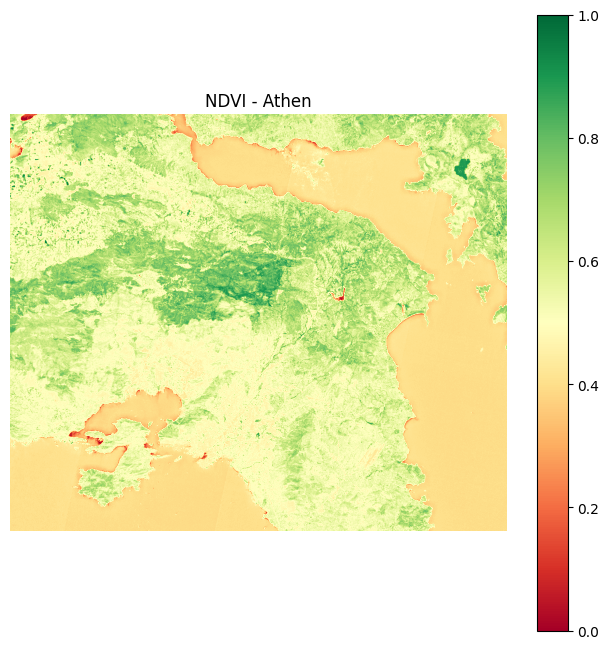

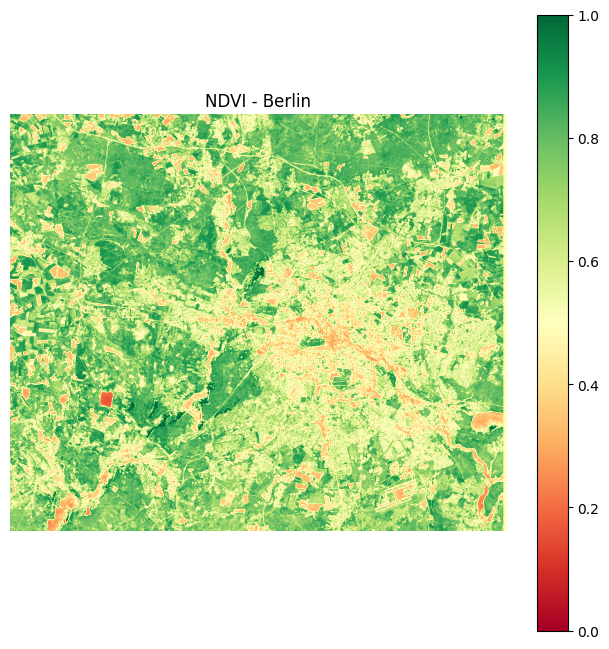

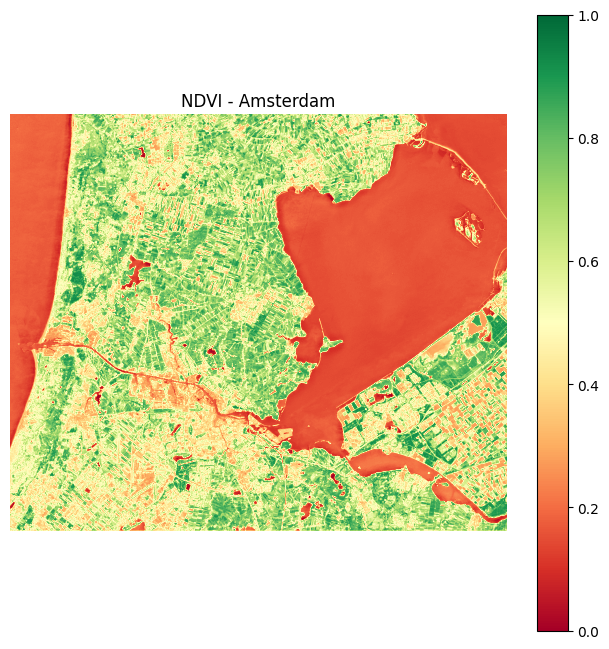

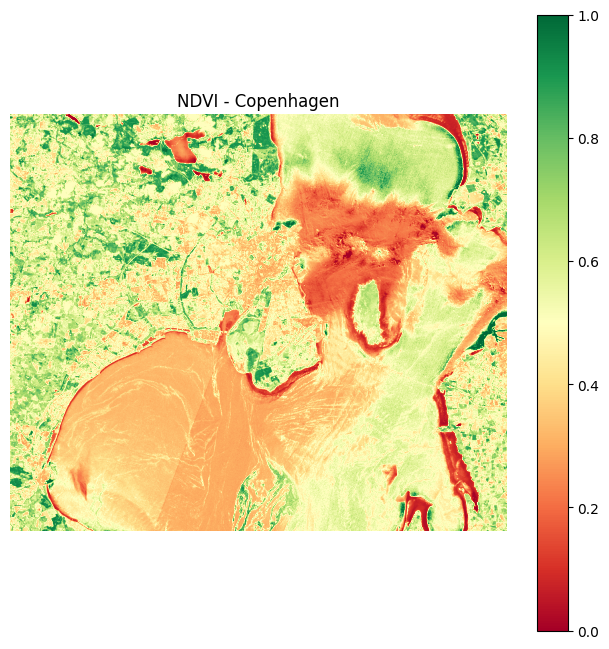

Mean NDVI values for each city:
Dublin: 0.5097
Madrid: 0.4923
Athen: 0.5287
Berlin: 0.6702
Amsterdam: 0.4573
Copenhagen: 0.4741

City with the highest mean NDVI: Berlin (0.6702)


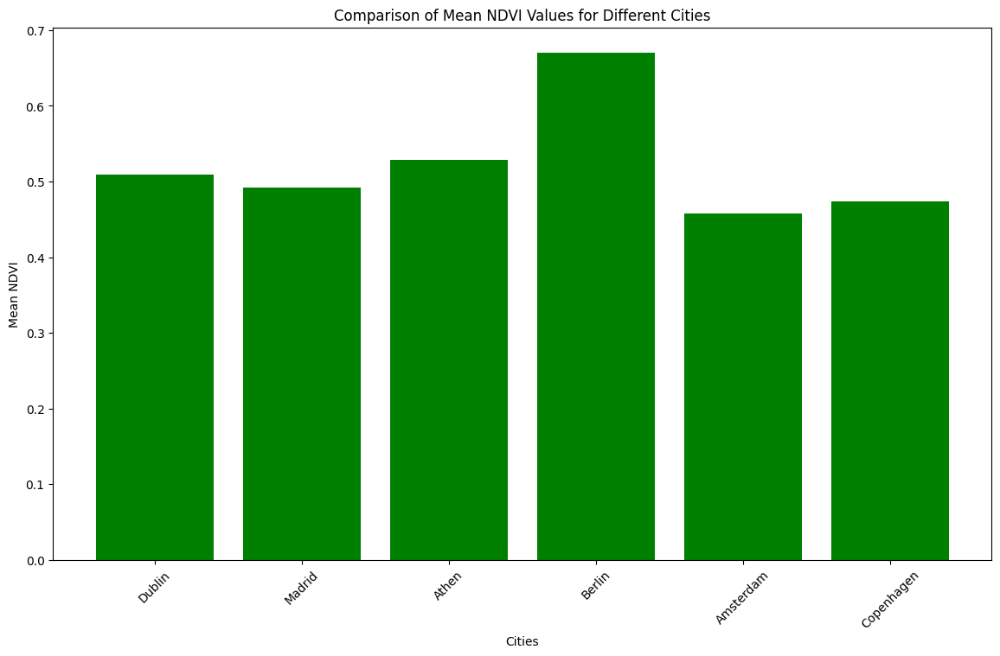

In [35]:
def calculate_ndvi(nir_path, red_path):
    """
    Calculate NDVI from NIR and Red images.
    
    :param nir_path: Path to the NIR image (Band B8)
    :param red_path: Path to the Red image (Band B4)
    :return: NDVI image
    """
    with rasterio.open(nir_path) as nir_dataset:
        nir = nir_dataset.read(1).astype(float)
    
    with rasterio.open(red_path) as red_dataset:
        red = red_dataset.read(1).astype(float)
    
    # Avoid division by zero
    ndvi = np.where((nir + red) == 0, 0, (nir - red) / (nir + red))
    ndvi_normalized = (ndvi + 1) / 2  # Normalize to the range [0, 1]
    
    return ndvi_normalized

def load_image_pairs_from_city_folders(base_folder):
    """
    Load NIR and Red image pairs from city folders within the specified base folder.
    """
    city_folders = [os.path.join(base_folder, city) for city in os.listdir(base_folder) if os.path.isdir(os.path.join(base_folder, city))]
    image_pairs = {}
    
    for city_folder in city_folders:
        nir_path = os.path.join(city_folder, 'B8.png')
        red_path = os.path.join(city_folder, 'B4.png')
        if os.path.exists(nir_path) and os.path.exists(red_path):
            city_name = os.path.basename(city_folder)
            image_pairs[city_name] = (nir_path, red_path)
    
    return image_pairs

def calculate_mean_ndvi(ndvi_image):
    """
    Calculate the mean NDVI value from the NDVI image.
    """
    return np.mean(ndvi_image)

def plot_ndvi(ndvi_image, title):
    """
    Plot the given NDVI image with the specified title.
    """
    plt.figure(figsize=(8, 8))
    plt.imshow(ndvi_image, cmap='RdYlGn')
    plt.colorbar()
    plt.title(title)
    plt.axis('off')
    plt.show()

def plot_vegetation_comparison(mean_ndvi_values):
    """
    Plot a bar chart comparing mean NDVI values for different cities.
    """
    cities = list(mean_ndvi_values.keys())
    mean_ndvi = list(mean_ndvi_values.values())
    
    plt.figure(figsize=(14, 8))
    plt.bar(cities, mean_ndvi, color='green')
    plt.xlabel('Cities')
    plt.ylabel('Mean NDVI')
    plt.title('Comparison of Mean NDVI Values for Different Cities')
    plt.xticks(rotation=45)
    plt.show()

# Suppress specific warnings
warnings.filterwarnings("ignore", category=rasterio.errors.NotGeoreferencedWarning)

base_directory_path = r'/Users/audrey/Desktop/Geomonitoring/Vegetationsindex'

if not os.path.exists(base_directory_path):
    print(f"Directory not found: {base_directory_path}")
else:
    image_pairs = load_image_pairs_from_city_folders(base_directory_path)
    print(f"Loaded NDVI image pairs for {len(image_pairs)} cities.")

# Calculate NDVI, mean NDVI values and plot NDVI images
mean_ndvi_values = {}

for city, (nir_path, red_path) in image_pairs.items():
    ndvi_image = calculate_ndvi(nir_path, red_path)
    plot_ndvi(ndvi_image, f'NDVI - {city}')
    mean_ndvi = calculate_mean_ndvi(ndvi_image)
    mean_ndvi_values[city] = mean_ndvi

# Find city with highest mean NDVI
best_city = max(mean_ndvi_values, key=mean_ndvi_values.get)
best_city_value = mean_ndvi_values[best_city]



print("Mean NDVI values for each city:")
for city, mean_ndvi in mean_ndvi_values.items():
    print(f"{city}: {mean_ndvi:.4f}")

print(f"\nCity with the highest mean NDVI: {best_city} ({best_city_value:.4f})")

plot_vegetation_comparison(mean_ndvi_values)


# Height maps and avg height for each city

Loaded 6 images.


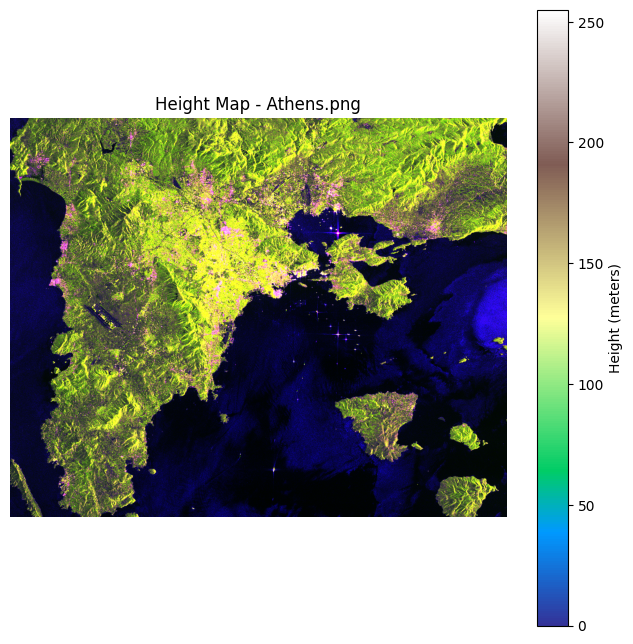

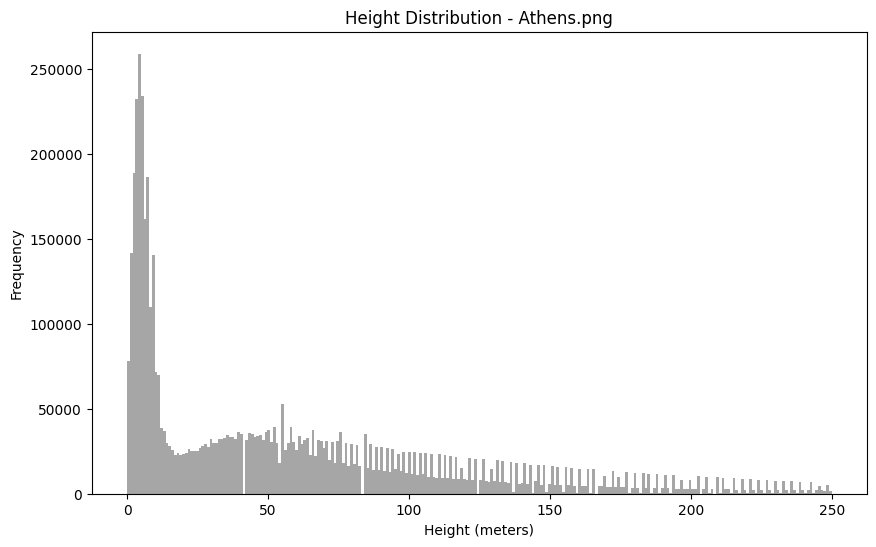

Image: Athens.png
Mean Height: 115.87 meters



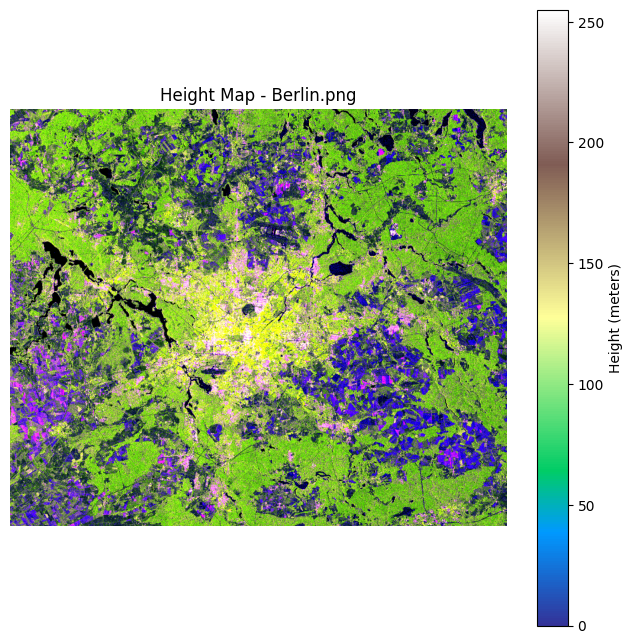

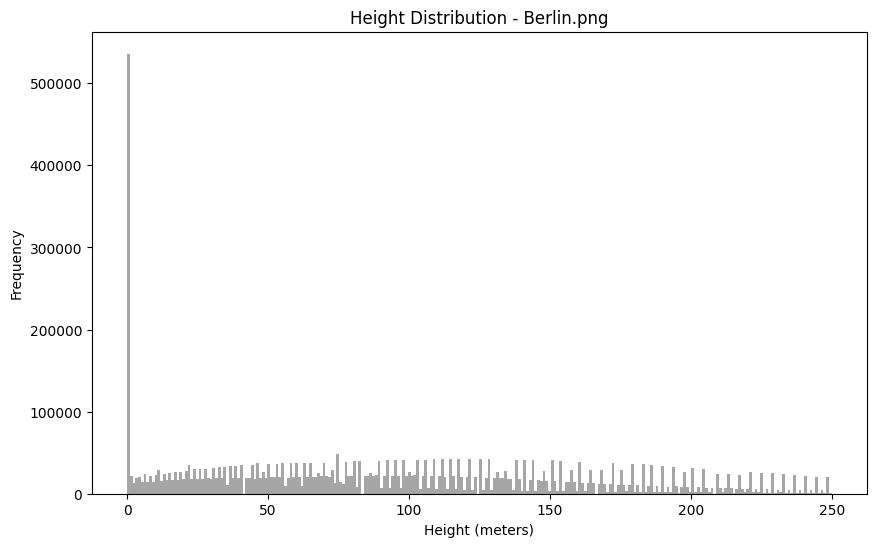

Image: Berlin.png
Mean Height: 147.64 meters



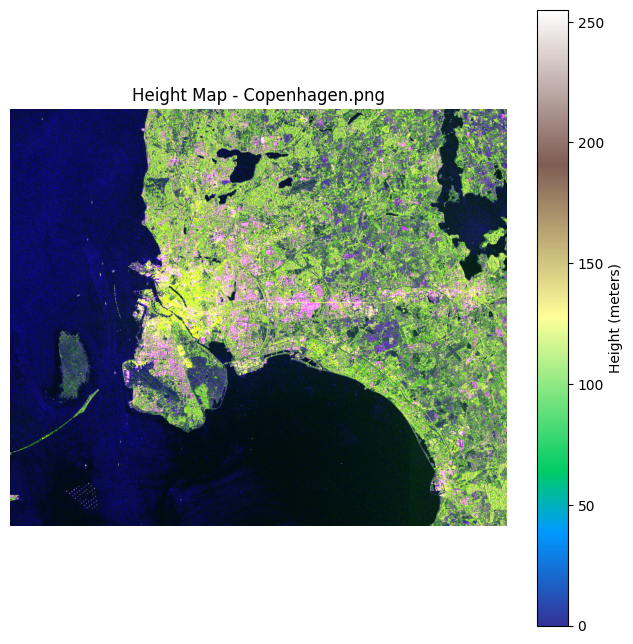

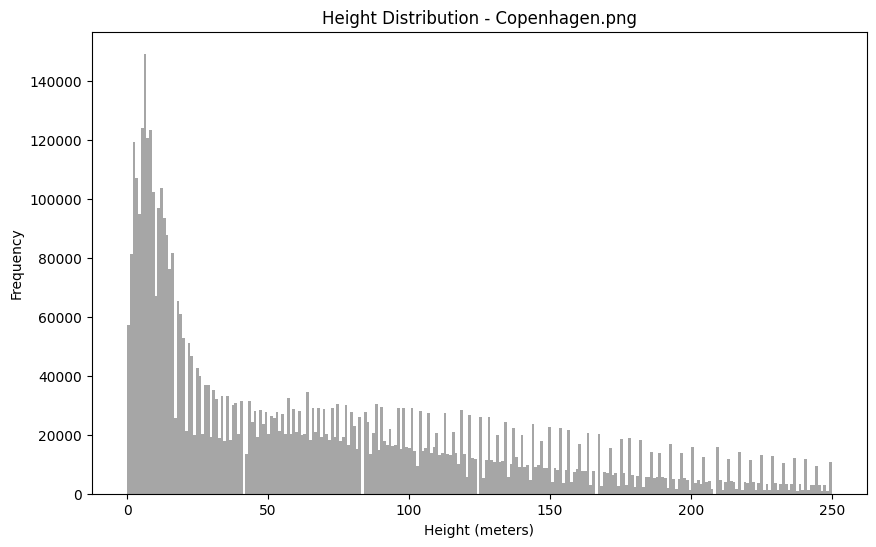

Image: Copenhagen.png
Mean Height: 126.28 meters



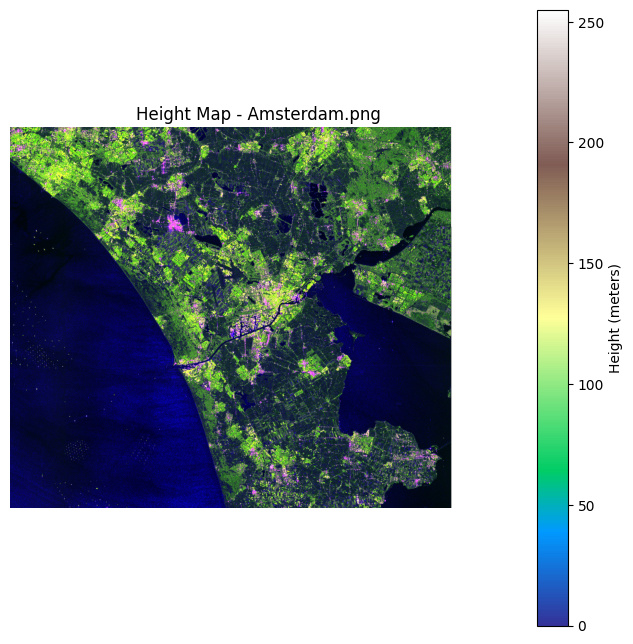

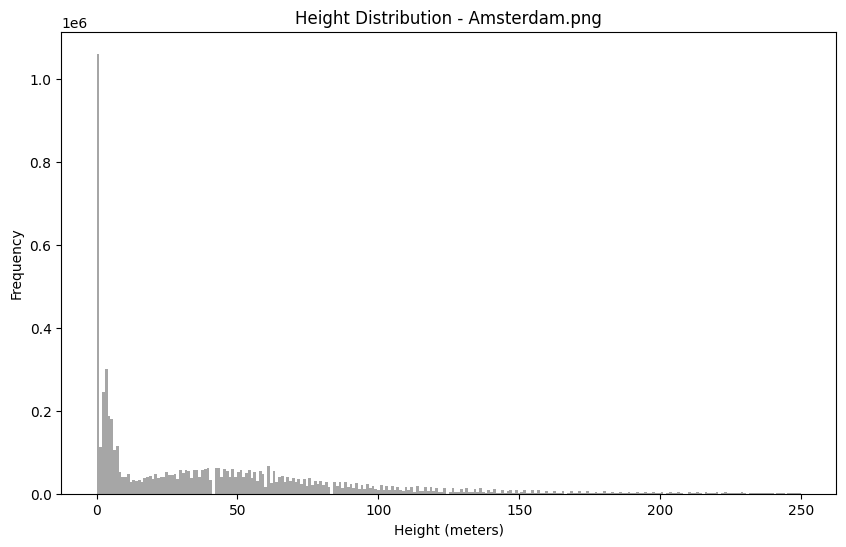

Image: Amsterdam.png
Mean Height: 93.12 meters



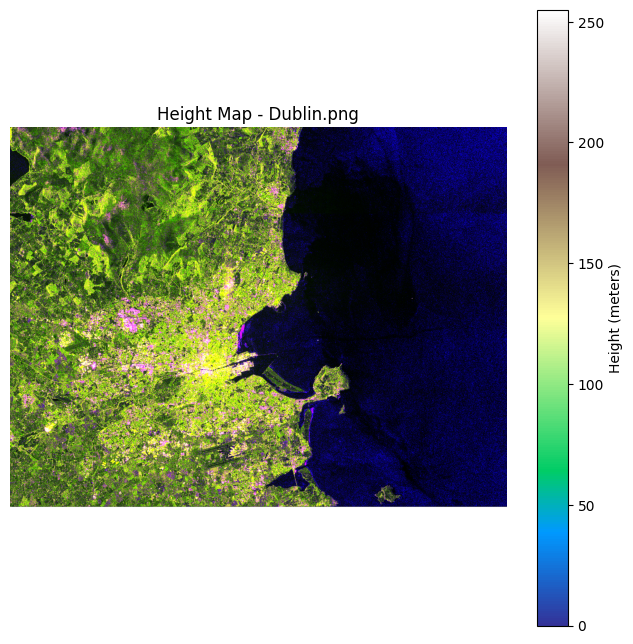

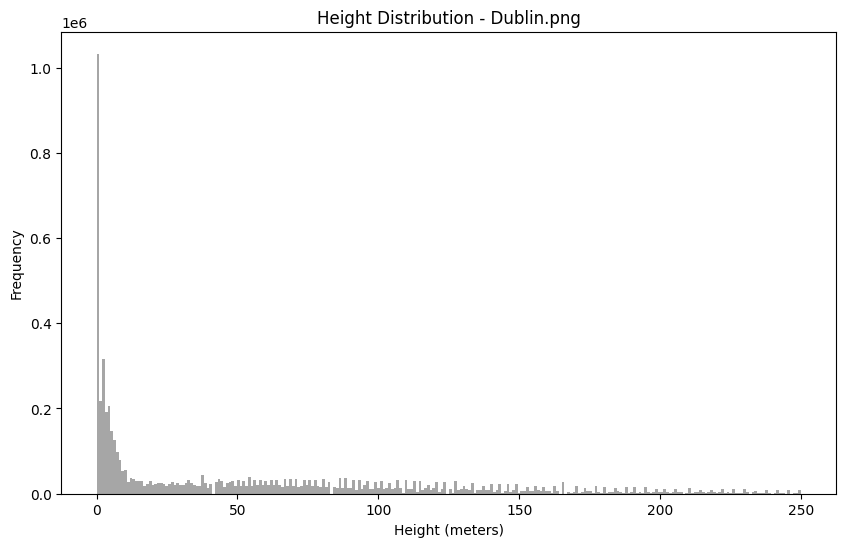

Image: Dublin.png
Mean Height: 113.68 meters



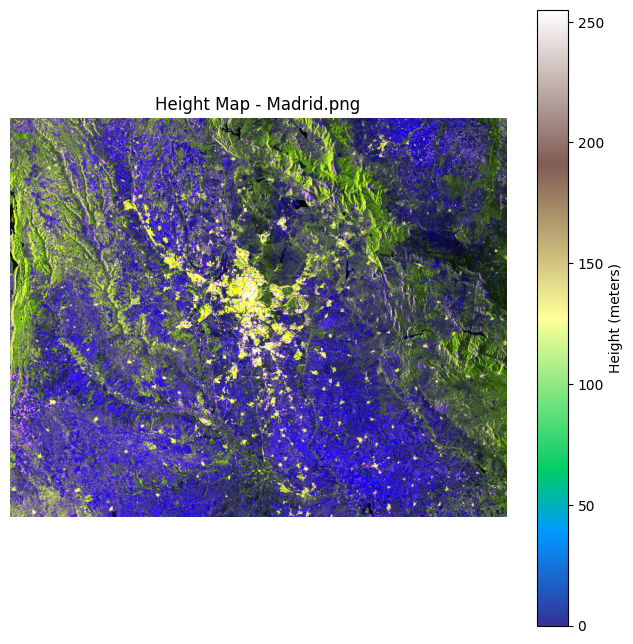

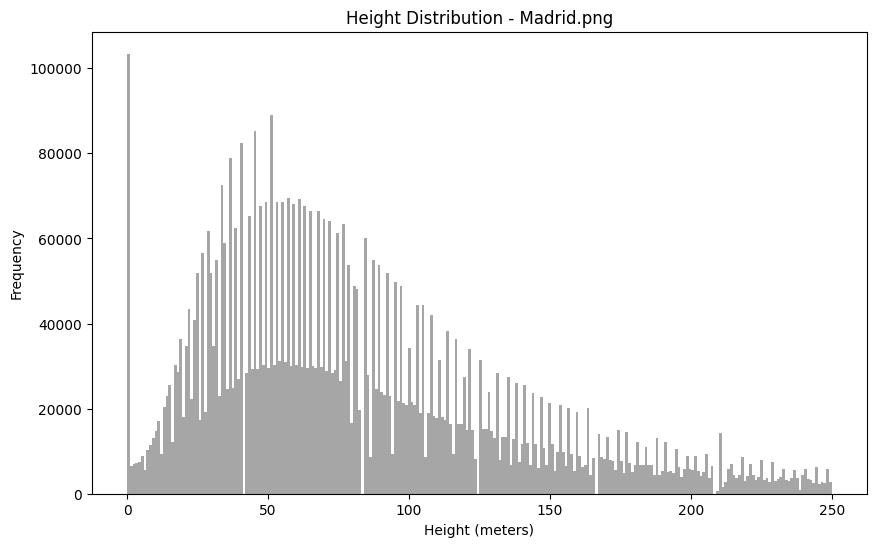

Image: Madrid.png
Mean Height: 133.08 meters



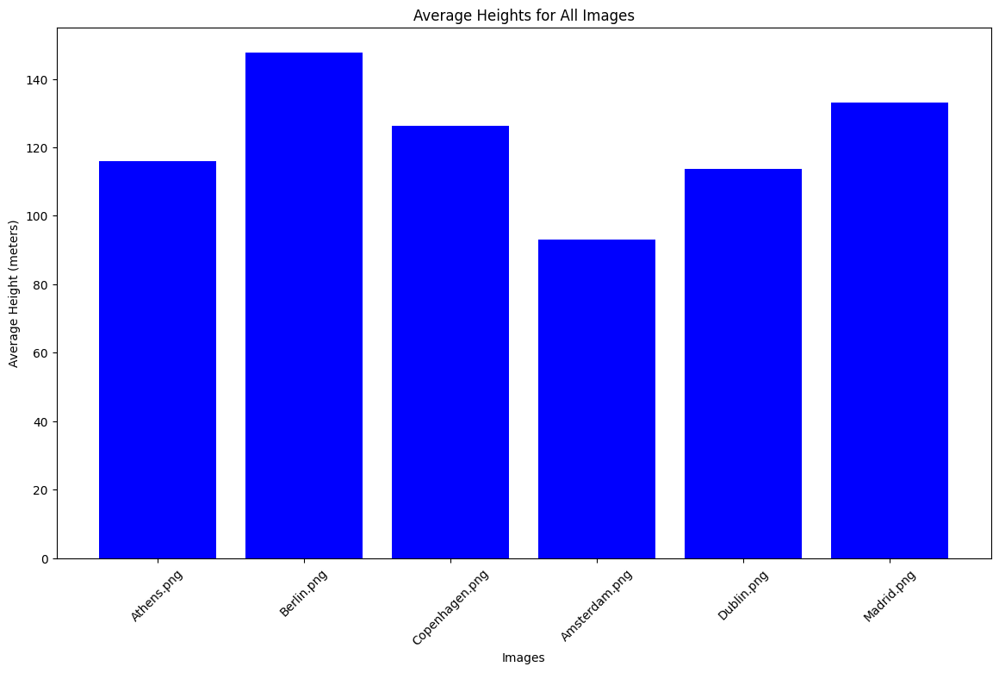

In [10]:
def load_images_from_folder(folder):
    """
    Load all PNG images from the specified folder.
    """
    images = []
    for filename in os.listdir(folder):
        if filename.endswith(".png"):
            img_path = os.path.join(folder, filename)
            img = Image.open(img_path)
            img_array = np.array(img)
            images.append((img_array, filename))
    return images

def calculate_statistics(image):
    """
    Calculate the mean of the height values in the image.
    """

    mean_height = np.mean(image)
    return mean_height

def plot_image(image, title):
    """
    Plot the given image with the specified title.
    """
    plt.figure(figsize=(8, 8))
    plt.imshow(image, cmap='terrain')
    plt.colorbar(label='Height (meters)')
    plt.title(title)
    plt.axis('off')
    plt.show()

def plot_height_distribution(image, title):
    """
    Plot the height distribution of the given image with the specified title.
    """
    filtered_image = image[image <= 250]  # Filter out heights greater than 250 meters
    plt.figure(figsize=(10, 6))
    plt.hist(filtered_image.ravel(), bins=256, color='gray', alpha=0.7)
    plt.title(f'Height Distribution - {title}')
    plt.xlabel('Height (meters)')
    plt.ylabel('Frequency')
    plt.show()

directory_path = '/Users/audrey/Desktop/Geomonitoring/Height_maps'

# Load images
if not os.path.exists(directory_path):
    print(f"Directory not found: {directory_path}")
else:
    images = load_images_from_folder(directory_path)
    print(f"Loaded {len(images)} images.")

avg_heights = []
filenames = []

# Process each image
for image, filename in images:
    min_height, max_height, mean_height = calculate_statistics(image)
    plot_image(image, f'Height Map - {filename}')
    plot_height_distribution(image, filename)
    print(f"Image: {filename}")
    print(f"Mean Height: {mean_height:.2f} meters")
    print()

    avg_heights.append(mean_height)
    filenames.append(filename)

# Plot average heights of all images
plt.figure(figsize=(14, 8))
plt.bar(filenames, avg_heights, color='blue')
plt.xlabel('Images')
plt.ylabel('Average Height (meters)')
plt.title('Average Heights for All Images')
plt.xticks(rotation=45)
plt.show()
